# Setup
1. In colab: Go to "Runtime" -> "Change runtime type" -> Select "T4 GPU"
2. Install TerraTorch

In [9]:
!pip install terratorch==1.0 gdown tensorboard

In [10]:
import os
import sys
import torch
import gdown
import terratorch
import albumentations
import lightning.pytorch as pl
import matplotlib.pyplot as plt
from terratorch.datamodules import MultiTemporalCropClassificationDataModule
import warnings
#os.environ["TENSORBOARD_PROXY_URL"]= os.environ["NB_PREFIX"]+"/proxy/6006/"
warnings.filterwarnings('ignore')

3. Download the dataset from Google Drive

In [3]:
# Download a random subset for demos (~1 GB)
if not os.path.isfile('multi-temporal-crop-classification-subset.tar.gz'):
    !gdown 1LL6thkuKA0kVyMI39PxgsrJ1FJJDV7-u

if not os.path.isdir('multi-temporal-crop-classification-subset/'):
    !tar -xzvf multi-temporal-crop-classification-subset.tar.gz

dataset_path = "multi-temporal-crop-classification-subset"

Downloading...
From (original): https://drive.google.com/uc?id=1LL6thkuKA0kVyMI39PxgsrJ1FJJDV7-u
From (redirected): https://drive.google.com/uc?id=1LL6thkuKA0kVyMI39PxgsrJ1FJJDV7-u&confirm=t&uuid=37dea0f9-7617-4e57-aa3d-7bf3c789a459
To: /content/multi-temporal-crop-classification-subset.tar.gz
100% 1.09G/1.09G [00:13<00:00, 82.8MB/s]
multi-temporal-crop-classification-subset/
multi-temporal-crop-classification-subset/._.DS_Store
tar: Ignoring unknown extended header keyword 'SCHILY.fflags'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.FinderInfo'
multi-temporal-crop-classification-subset/.DS_Store
multi-temporal-crop-classification-subset/._training_chips
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/training_chips/
multi-temporal-crop-classification-subset/._validation_chips
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-cr

## Multi-temporal Crop Dataset

Lets start with analyzing the dataset


In [4]:
!ls "{dataset_path}"

training_chips	training_data.txt  validation_chips  validation_data.txt


In [5]:
# Each merged sample includes the stacked bands of three time steps
!ls "{dataset_path}/training_chips" | head

chip_003_062.mask.tif
chip_003_062_merged.tif
chip_003_063.mask.tif
chip_003_063_merged.tif
chip_010_063.mask.tif
chip_010_063_merged.tif
chip_019_091.mask.tif
chip_019_091_merged.tif
chip_022_126.mask.tif
chip_022_126_merged.tif


In [13]:
# Adjusted dataset class for this dataset (general dataset could be used as well)
from terratorch.datasets.transforms import FlattenTemporalIntoChannels, UnflattenTemporalFromChannels

datamodule = MultiTemporalCropClassificationDataModule(
    batch_size=8,
    num_workers=2,
    data_root=dataset_path,
    train_transform=[
        FlattenTemporalIntoChannels(),  # Required for temporal data
        albumentations.D4(), # Random flips and rotation
        albumentations.pytorch.transforms.ToTensorV2(),
        UnflattenTemporalFromChannels(n_timesteps=3),
    ],
    val_transform=None,  # Using ToTensor() by default
    test_transform=None,
    expand_temporal_dimension=True,
    use_metadata=False, # The crop dataset has metadata for location and time
    reduce_zero_label=True,
)

# Setup train and val datasets
datamodule.setup("fit")

In [14]:
# checking for the dataset means and stds
datamodule.means, datamodule.stds

([494.905781, 815.239594, 924.335066, 2968.881459, 2634.621962, 1739.579917],
 [284.925432, 357.84876, 575.566823, 896.601013, 951.900334, 921.407808])

In [15]:
# checking datasets train split size
train_dataset = datamodule.train_dataset
len(train_dataset)

462

In [16]:
# checking datasets available bands
train_dataset.all_band_names

('BLUE', 'GREEN', 'RED', 'NIR_NARROW', 'SWIR_1', 'SWIR_2')

In [17]:
# checking datasets classes
train_dataset.class_names

('Natural Vegetation',
 'Forest',
 'Corn',
 'Soybeans',
 'Wetlands',
 'Developed / Barren',
 'Open Water',
 'Winter Wheat',
 'Alfalfa',
 'Fallow / Idle Cropland',
 'Cotton',
 'Sorghum',
 'Other')

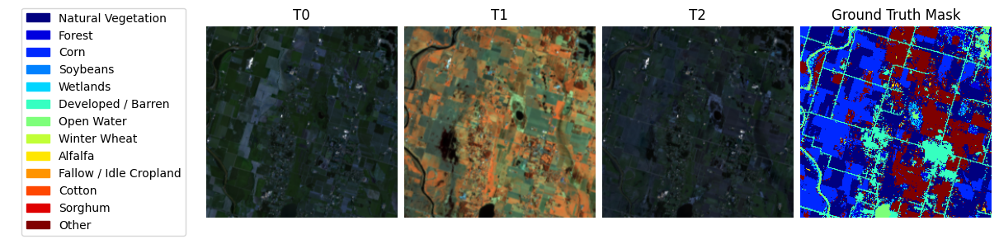

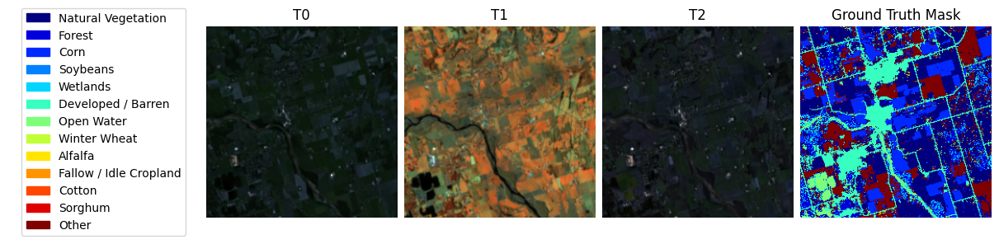

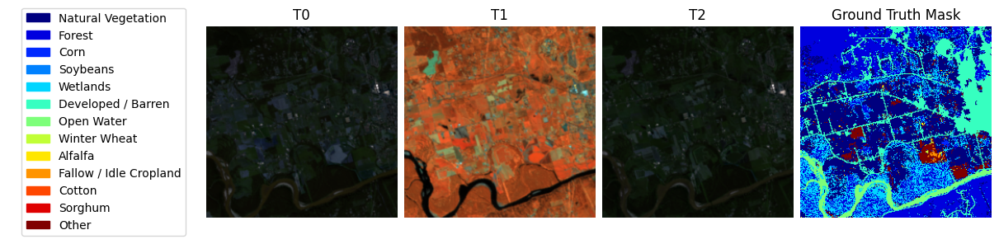

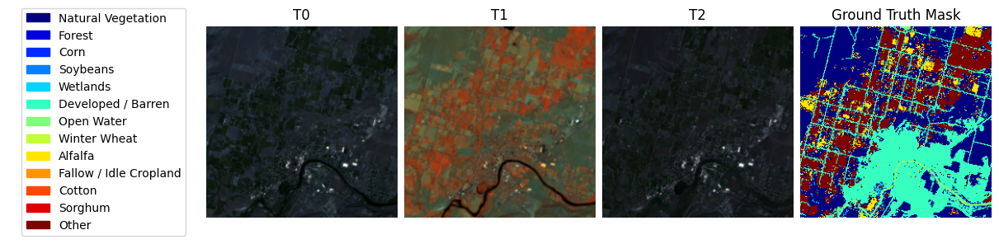

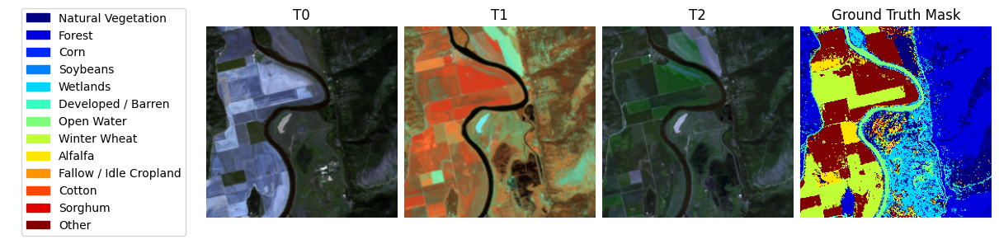

In [18]:
# plotting a few samples
for i in range(5):
    train_dataset.plot(train_dataset[i])

In [19]:
# checking datasets validation split size
val_dataset = datamodule.val_dataset
len(val_dataset)

250

In [20]:
# checking datasets testing split size
datamodule.setup("test")
test_dataset = datamodule.test_dataset
len(test_dataset)

250

# Fine-tune Prithvi

In [21]:
pl.seed_everything(0)

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    dirpath="output/multicrop/checkpoints/",
    mode="max",
    monitor="val/Multiclass_Jaccard_Index", # Variable to monitor
    filename="best-{epoch:02d}",
)

# Lightning Trainer
trainer = pl.Trainer(
    accelerator="auto",
    strategy="auto",
    devices=1, # Lightning multi-gpu often fails in notebooks
    precision='bf16-mixed',  # Speed up training
    num_nodes=1,
    logger=True, # Uses TensorBoard by default
    max_epochs=1, # For demos
    log_every_n_steps=5,
    enable_checkpointing=True,
    callbacks=[checkpoint_callback, pl.callbacks.RichProgressBar()],
    default_root_dir="output/multicrop",
)

# Model
model = terratorch.tasks.SemanticSegmentationTask(
    model_factory="EncoderDecoderFactory",
    model_args={
        # Backbone
        "backbone": "prithvi_eo_v2_300_tl", # Model can be either prithvi_eo_v1_100, prithvi_eo_v2_300, prithvi_eo_v2_300_tl, prithvi_eo_v2_600, prithvi_eo_v2_600_tl
        "backbone_pretrained": True,
        "backbone_num_frames": 3,
        "backbone_bands": ["BLUE", "GREEN", "RED", "NIR_NARROW", "SWIR_1", "SWIR_2"],
        "backbone_coords_encoding": [], # use ["time", "location"] for time and location metadata

        # Necks
        "necks": [
            {
                "name": "SelectIndices",
                # "indices": [2, 5, 8, 11] # indices for prithvi_eo_v1_100
                "indices": [5, 11, 17, 23] # indices for prithvi_eo_v2_300
                # "indices": [7, 15, 23, 31] # indices for prithvi_eo_v2_600
            },
            {
                "name": "ReshapeTokensToImage",
                "effective_time_dim": 3
            },
            {"name": "LearnedInterpolateToPyramidal"},
        ],

        # Decoder
        "decoder": "UNetDecoder",
        "decoder_channels": [512, 256, 128, 64],

        # Head
        "head_dropout": 0.1,
        "num_classes": 13,
    },

    loss="ce",
    lr=1e-4,
    optimizer="AdamW",
    ignore_index=-1,
    freeze_backbone=True,  # Speeds up fine-tuning
    freeze_decoder=False,
    plot_on_val=True,

)

INFO: Seed set to 0
INFO:lightning.fabric.utilities.seed:Seed set to 0
INFO: Using bfloat16 Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using bfloat16 Automatic Mixed Precision (AMP)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


config.json:   0%|          | 0.00/776 [00:00<?, ?B/s]

Prithvi_EO_V2_300M_TL.pt:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

In [22]:
%reload_ext tensorboard
%tensorboard --logdir output/multicrop

<IPython.core.display.Javascript object>

In [23]:
# Training
trainer.fit(model, datamodule=datamodule)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │  383 M │ train │
│ 1 │ criterion     │ CrossEntropyLoss │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 79.9 M                                                                                           
Non-trainable params: 303 M                                                                                        
Total params: 383 M                                                                                                
Total estimated model params size (MB): 1.5 K                                                                      
Modules in train mode: 617                                                                                         
Modules in eval mode: 0

Output()

INFO: `Trainer.fit` stopped: `max_epochs=1` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.


In [24]:
best_ckpt_path = "output/multicrop/checkpoints/best-epoch=00.ckpt"

In [25]:
def run_test_and_plot(model, ckpt_path):

    # calculate test metrics
    trainer.test(model, datamodule=datamodule, ckpt_path=ckpt_path)

    # get predictions
    preds = trainer.predict(model, datamodule=datamodule, ckpt_path=ckpt_path)

    # get data
    data_loader = trainer.predict_dataloaders
    batch = next(iter(data_loader))

    # plot
    BATCH_SIZE = 8
    for i in range(BATCH_SIZE):

        sample = {key: batch[key][i] for key in batch}
        sample["prediction"] = preds[0][0][i].cpu().numpy()

        datamodule.predict_dataset.plot(sample)


INFO: Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃             Test metric             ┃            DataLoader 0             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/Multiclass_Accuracy       │         0.2769058644771576          │
│      test/Multiclass_F1_Score       │         0.2769058644771576          │
│    test/Multiclass_Jaccard_Index    │         0.13855427503585815         │
│ test/Multiclass_Jaccard_Index_Micro │         0.1607026904821396          │
│              test/loss              │         2.2433106899261475          │
│      test/multiclassaccuracy_0      │         0.2890803813934326          │
│      test/multiclassaccuracy_1      │         0.19678103923797607         │
│     test/multiclassaccuracy_10      │        0.0011544006410986185        │
│     test/multiclassaccuracy_11      │        0.029642179608345032         │
│     test/multiclassaccuracy_12      │         0.13071228563785553         │
│      test/multiclassaccuracy_2      │         0.04701073095202446         │
│      test/multiclassaccuracy_3      │         0.4747143089771271          │
│      test/multiclassaccuracy_4      │          0.57952481508255           │
│      test/multiclassaccuracy_5      │         0.45983853936195374         │
│      test/multiclassaccuracy_6      │         0.6490558385848999          │
│      test/multiclassaccuracy_7      │         0.5927164554595947          │
│      test/multiclassaccuracy_8      │         0.08543423563241959         │
│      test/multiclassaccuracy_9      │        0.004347415640950203         │
│    test/multiclassjaccardindex_0    │         0.22773467004299164         │
│    test/multiclassjaccardindex_1    │         0.15053722262382507         │
│   test/multiclassjaccardindex_10    │        0.001142369699664414         │
│   test/multiclassjaccardindex_11    │         0.02658097818493843         │
│   test/multiclassjaccardindex_12    │         0.07907000929117203         │
│    test/multiclassjaccardindex_2    │        0.044621504843235016         │
│    test/multiclassjaccardindex_3    │         0.1657605916261673          │
│    test/multiclassjaccardindex_4    │         0.2815878093242645          │
│    test/multiclassjaccardindex_5    │         0.1572539061307907          │
│    test/multiclassjaccardindex_6    │         0.4315153658390045          │
│    test/multiclassjaccardindex_7    │         0.19428116083145142         │
│    test/multiclassjaccardindex_8    │         0.0369129553437233          │
│    test/multiclassjaccardindex_9    │        0.004206953104585409         │
└─────────────────────────────────────┴─────────────────────────────────────┘

INFO: Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt


Output()

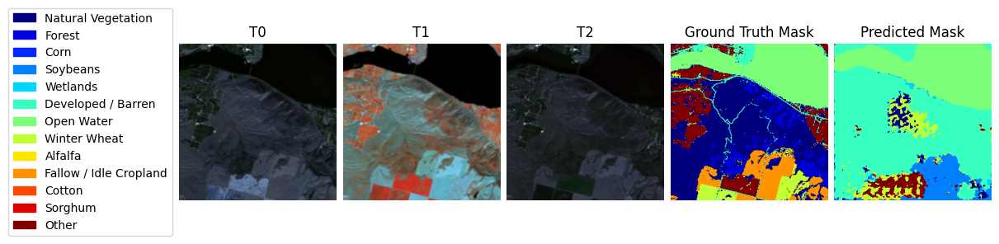

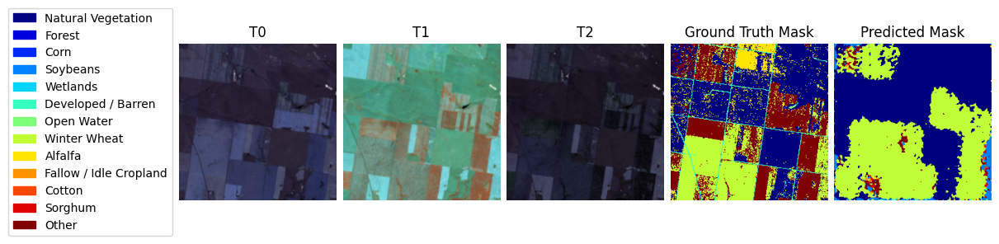

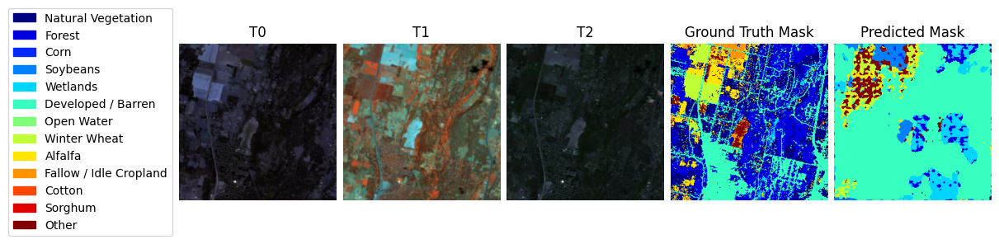

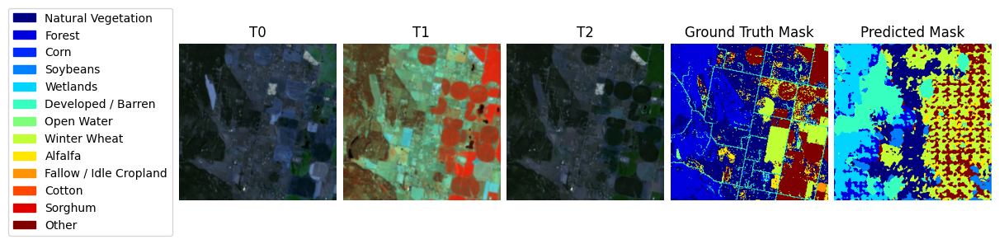

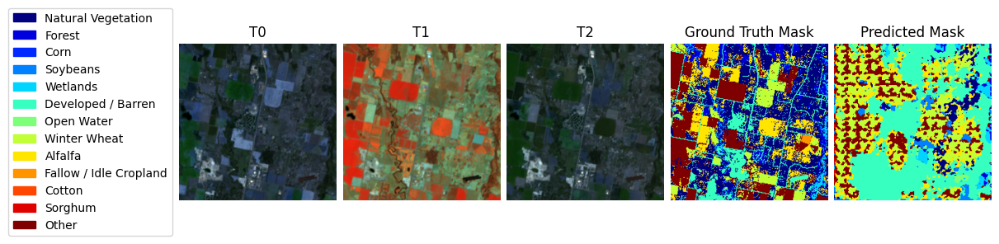

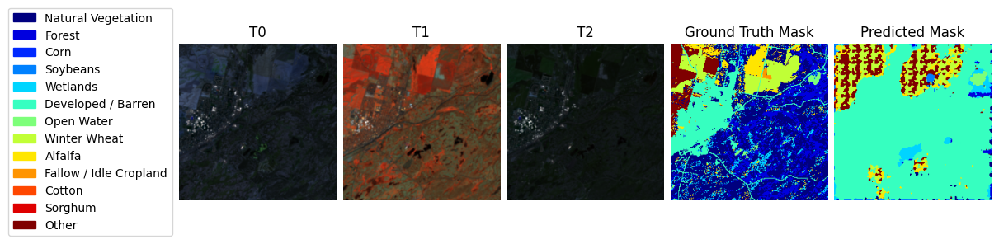

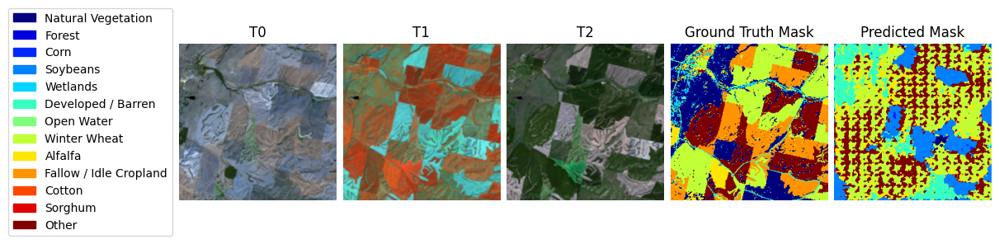

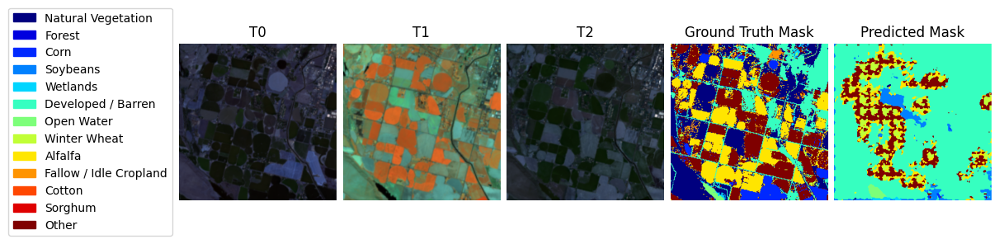

In [26]:
run_test_and_plot(model, best_ckpt_path)

In [27]:
best_ckpt_100_epoch_path = "multicrop_best-epoch=76.ckpt"

if not os.path.isfile(best_ckpt_100_epoch_path):
    gdown.download("https://drive.google.com/uc?id=1o1Hzd4yyiKyYdzfotQlEOeGTjsM8cHSw")


Downloading...
From (original): https://drive.google.com/uc?id=1o1Hzd4yyiKyYdzfotQlEOeGTjsM8cHSw
From (redirected): https://drive.google.com/uc?id=1o1Hzd4yyiKyYdzfotQlEOeGTjsM8cHSw&confirm=t&uuid=f9bb393d-750e-47c9-adbc-793c654c661f
To: /content/multicrop_best-epoch=76.ckpt
100%|██████████| 2.18G/2.18G [00:46<00:00, 47.0MB/s]


INFO: Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃             Test metric             ┃            DataLoader 0             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/Multiclass_Accuracy       │         0.5600309371948242          │
│      test/Multiclass_F1_Score       │         0.5600309371948242          │
│    test/Multiclass_Jaccard_Index    │         0.3772466778755188          │
│ test/Multiclass_Jaccard_Index_Micro │         0.3889187276363373          │
│              test/loss              │         1.3244150876998901          │
│      test/multiclassaccuracy_0      │         0.7489084601402283          │
│      test/multiclassaccuracy_1      │         0.6184440851211548          │
│     test/multiclassaccuracy_10      │         0.3405184745788574          │
│     test/multiclassaccuracy_11      │         0.5057629346847534          │
│     test/multiclassaccuracy_12      │         0.3452084958553314          │
│      test/multiclassaccuracy_2      │         0.6035131216049194          │
│      test/multiclassaccuracy_3      │         0.47803017497062683         │
│      test/multiclassaccuracy_4      │         0.5394032001495361          │
│      test/multiclassaccuracy_5      │         0.3911316990852356          │
│      test/multiclassaccuracy_6      │         0.7620816826820374          │
│      test/multiclassaccuracy_7      │         0.6053557991981506          │
│      test/multiclassaccuracy_8      │         0.4043838679790497          │
│      test/multiclassaccuracy_9      │         0.5013613700866699          │
│    test/multiclassjaccardindex_0    │         0.4586365520954132          │
│    test/multiclassjaccardindex_1    │         0.4343146085739136          │
│   test/multiclassjaccardindex_10    │         0.2467104196548462          │
│   test/multiclassjaccardindex_11    │         0.3546394109725952          │
│   test/multiclassjaccardindex_12    │         0.25727564096450806         │
│    test/multiclassjaccardindex_2    │         0.4479222297668457          │
│    test/multiclassjaccardindex_3    │         0.33904096484184265         │
│    test/multiclassjaccardindex_4    │         0.39269253611564636         │
│    test/multiclassjaccardindex_5    │         0.2909693121910095          │
│    test/multiclassjaccardindex_6    │         0.6637493371963501          │
│    test/multiclassjaccardindex_7    │         0.43035927414894104         │
│    test/multiclassjaccardindex_8    │         0.25226688385009766         │
│    test/multiclassjaccardindex_9    │         0.3356294333934784          │
└─────────────────────────────────────┴─────────────────────────────────────┘

INFO: Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt


Output()

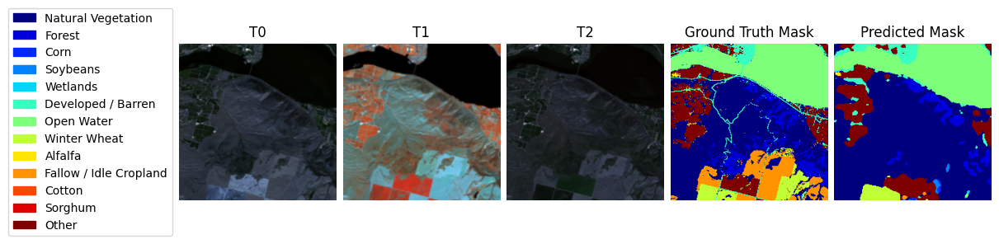

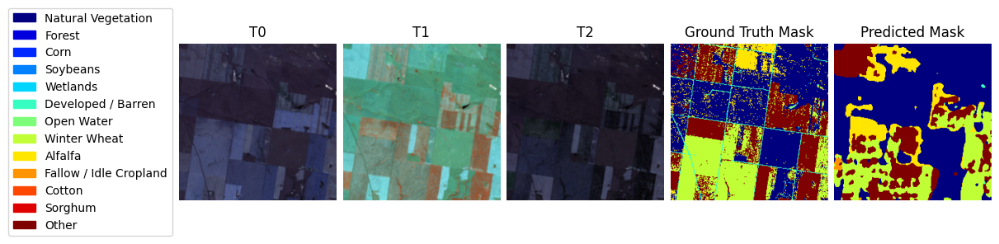

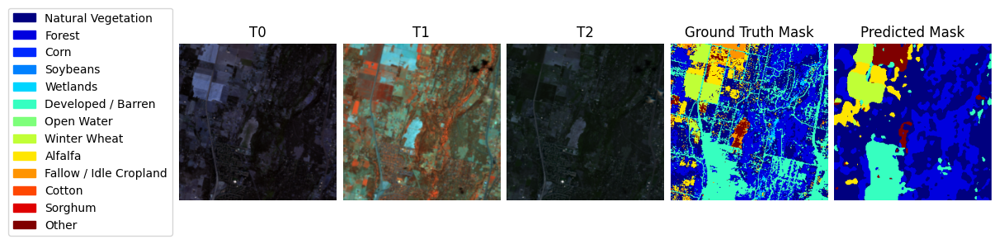

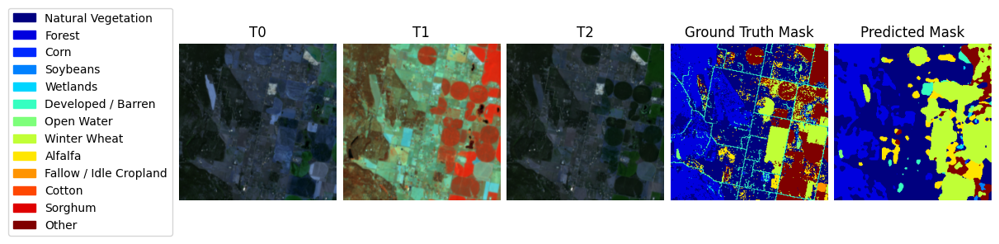

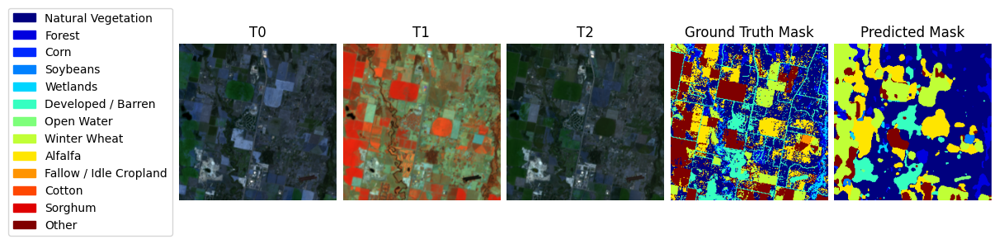

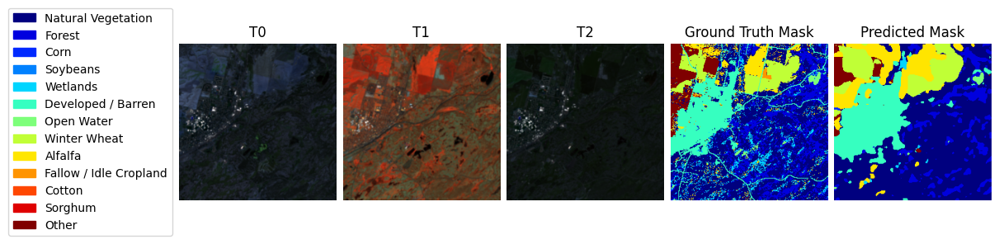

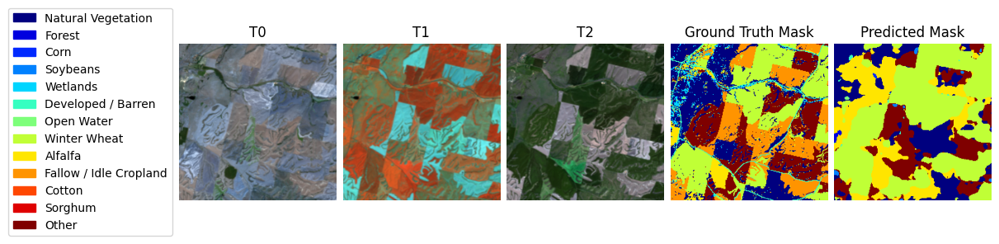

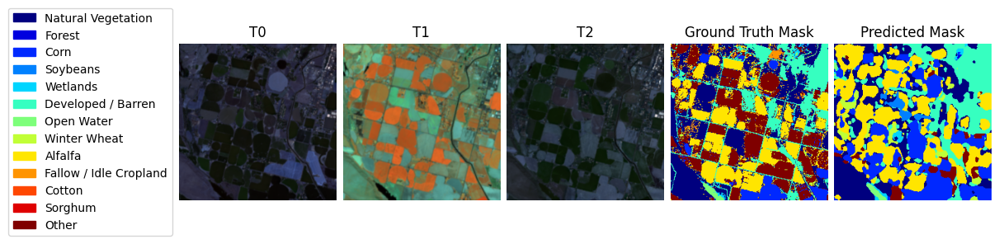

In [28]:
run_test_and_plot(model, best_ckpt_100_epoch_path)